In [8]:
%matplotlib inline

In [24]:
import random
import itertools

In [5]:
from moviepy.editor import VideoFileClip
from pylab import *

In [101]:
video = VideoFileClip('./IMG_0008.MOV')

In [31]:
import seaborn as sns

In [102]:
brightnesses = [np.mean(frame) for frame in video.iter_frames()]

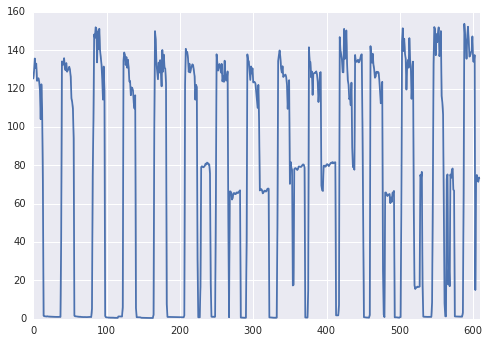

In [103]:
sns.tsplot(brightnesses)

In [104]:
mask = [b >= 60 for b in brightnesses]

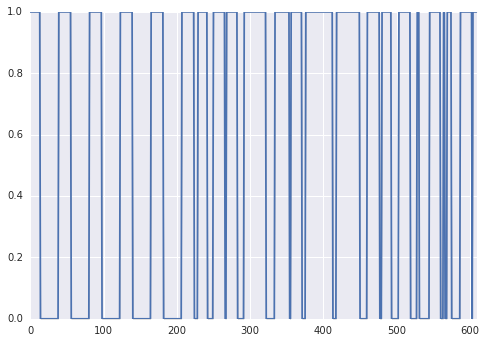

In [105]:
sns.tsplot(mask)

In [106]:
from moviepy.editor import concatenate_videoclips

In [107]:
ranges = []
last = 0
for t, frame in enumerate(mask):
    if mask[t]!=mask[t-1]:
        if(not frame):
            ranges.append((last/30.,(t-1)/30.))
        else:
            last = t   
ranges = ranges[1:]

In [108]:
ranges

[(1.3, 1.8333333333333333),
 (2.7, 3.2333333333333334),
 (4.1, 4.633333333333334),
 (5.5, 6.033333333333333),
 (6.9, 7.433333333333334),
 (7.633333333333334, 8.033333333333333),
 (8.333333333333334, 8.833333333333334),
 (8.933333333333334, 9.4),
 (9.733333333333333, 10.7),
 (11.133333333333333, 11.766666666666667),
 (11.866666666666667, 12.333333333333334),
 (12.533333333333333, 13.733333333333333),
 (13.933333333333334, 14.966666666666667),
 (15.333333333333334, 15.866666666666667),
 (16.0, 16.4),
 (16.766666666666666, 17.266666666666666),
 (17.6, 17.666666666666668),
 (18.166666666666668, 18.633333333333333),
 (18.8, 18.833333333333332),
 (18.966666666666665, 19.133333333333333),
 (19.566666666666666, 20.066666666666666)]

In [109]:
video.fps

30.0

In [110]:
final = concatenate_videoclips([video.subclip(*rg) for rg in ranges])

In [111]:
final

<moviepy.video.VideoClip.VideoClip instance at 0x10dff4e60>

In [112]:
from moviepy.editor import ipython_display

In [113]:
ipython_display(final, width=240)

100%|██████████| 330/330 [00:03<00:00, 99.49it/s]


In [114]:
final.write_videofile('nonight.mp4')

[MoviePy] >>>> Building video nonight.mp4
[MoviePy] Writing video nonight.mp4


100%|██████████| 330/330 [00:07<00:00, 43.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: nonight.mp4 

